In [ ]:
pip install geopandas

     |████████████████████████████████| 1.0 MB 31.3 MB/s 
     |████████████████████████████████| 6.3 MB 72.9 MB/s 
     |████████████████████████████████| 15.4 MB 37 kB/s 


In [ ]:
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

# Map 1 library
import plotly.express as px

# Map 2 libraries
import descartes
import geopandas as gpd # allows spatial operation on geometry types, i.e., operations are performed shapely
from shapely.geometry import Point, Polygon

# Librosa Libraries
""" Python module to analyze audio signals 
    in general but geared more towards music"""
import librosa
import librosa.display
import IPython.display as ipd

import sklearn

import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving amered.mp3 to amered.mp3
Saving cangoo.mp3 to cangoo.mp3
Saving haiwoo.mp3 to haiwoo.mp3
Saving pingro.mp3 to pingro.mp3
Saving vesspa.mp3 to vesspa.mp3


In [ ]:
audio_data_amered = 'amered.mp3'
x, sr = librosa.load(audio_data_amered) # sr-> sampling rate,i.e., no. of samples of audio carried per second ( measured in Hz)
# x -> audio time series numpy array
print(type(x), type(sr)) # returns audio-time series as numpy array with a default sampling rate(sr) of 22 kHz mono
print(x.shape,sr)
librosa.load(audio_data_amered, sr=44100) # resampling at 44 kHz 

<class 'numpy.ndarray'> <class 'int'>
(113608,) 22050


(array([ 4.5776367e-05, -1.5258789e-04, -1.9836426e-04, ...,
        -8.0871582e-04, -3.7384033e-03, -2.9449463e-03], dtype=float32), 44100)

In [ ]:
# Playing the audio using IPythn.isplay.Audio

ipd.Audio(audio_data_amered)

In [ ]:
audio_data_cangoo = 'cangoo.mp3'
librosa.load(audio_data_cangoo)
ipd.Audio(audio_data_cangoo)

In [ ]:
audio_data_haiwoo = 'haiwoo.mp3'
librosa.load(audio_data_haiwoo)
ipd.Audio(audio_data_haiwoo)

In [ ]:
audio_data_pingro = 'pingro.mp3'
librosa.load(audio_data_pingro)
ipd.Audio(audio_data_pingro)

In [ ]:
audio_data_vesspa = 'vesspa.mp3'
librosa.load(audio_data_vesspa)
ipd.Audio(audio_data_vesspa)

### Sound Wave 2d- representation

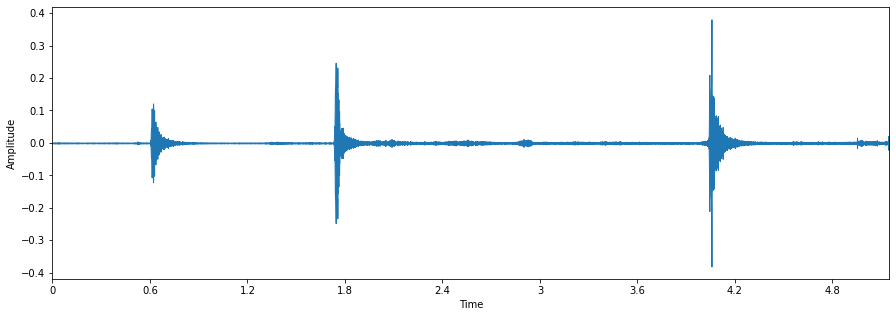

In [ ]:
# Visualizzing audio using librosa.display.waveplot

plt.figure(figsize = (15,5))
plt.xlabel("Time")
plt.ylabel("Amplitude")
librosa.display.waveplot(x,sr= sr)


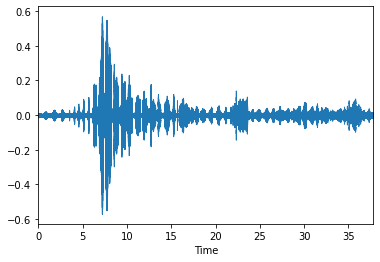

In [ ]:
librosa.display.waveplot(librosa.load(audio_data_cangoo)[0],sr= sr)


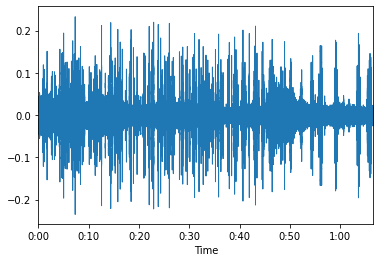

In [ ]:
librosa.display.waveplot(librosa.load(audio_data_haiwoo)[0],sr= sr)


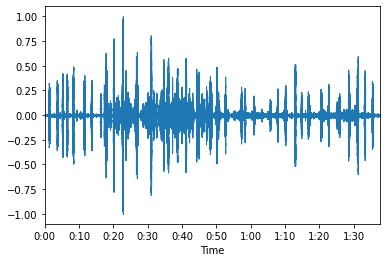

In [ ]:
librosa.display.waveplot(librosa.load(audio_data_pingro)[0],sr= sr)


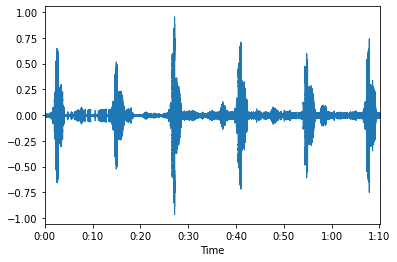

In [ ]:
librosa.display.waveplot(librosa.load(audio_data_vesspa)[0],sr= sr)

In [ ]:
# numpy nd arrays of audio time signal
audio_amered = librosa.load(audio_data_amered)[0]
audio_cangoo = librosa.load(audio_data_cangoo)[0]
audio_haiwoo = librosa.load(audio_data_haiwoo)[0]
audio_pingro = librosa.load(audio_data_pingro)[0]
audio_vesspa = librosa.load(audio_data_vesspa)[0]

###Fourier-Transform

.stft() converts data into short term Fourier transform. STFT converts signals such that we can know the amplitude of the given frequency at a given time. 

Using STFT we can determine the amplitude of various frequencies playing at a given time of an audio signal. 

.specshow is used to display a spectrogram.


In [ ]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D_amered = np.abs(librosa.stft(audio_amered, n_fft = n_fft, hop_length = hop_length))
D_cangoo = np.abs(librosa.stft(audio_cangoo, n_fft = n_fft, hop_length = hop_length))
D_haiwoo = np.abs(librosa.stft(audio_haiwoo, n_fft = n_fft, hop_length = hop_length))
D_pingro = np.abs(librosa.stft(audio_pingro, n_fft = n_fft, hop_length = hop_length))
D_vesspa = np.abs(librosa.stft(audio_vesspa, n_fft = n_fft, hop_length = hop_length))

In [ ]:
print('Shape of D object:', np.shape(D_haiwoo))

Shape of D object: (1025, 2868)


### Spectogram

A visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams.

 For audio signals, analyzing in the frequency domain is easier than in the time domain.

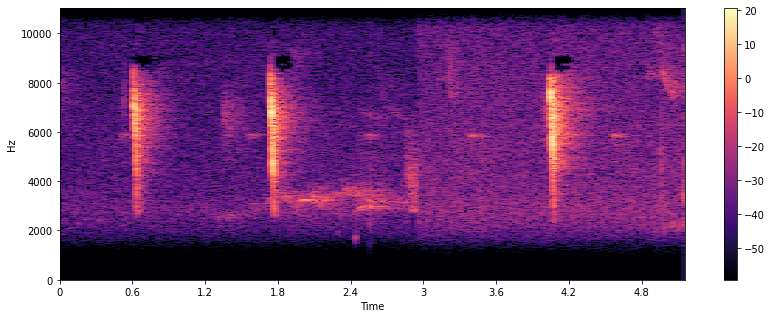

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_amered), sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

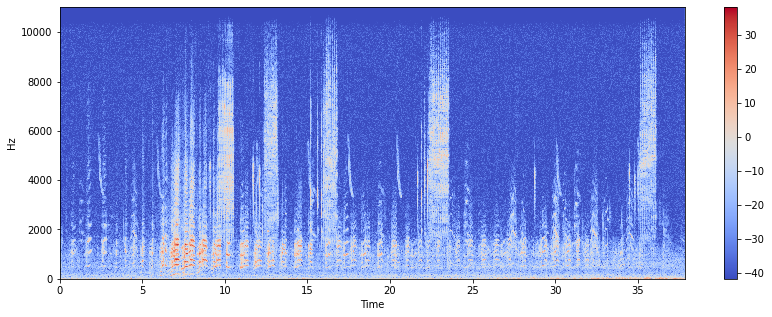

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_cangoo), sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

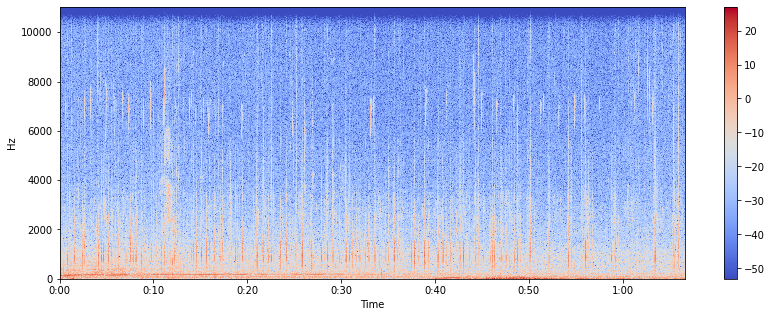

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_haiwoo), sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

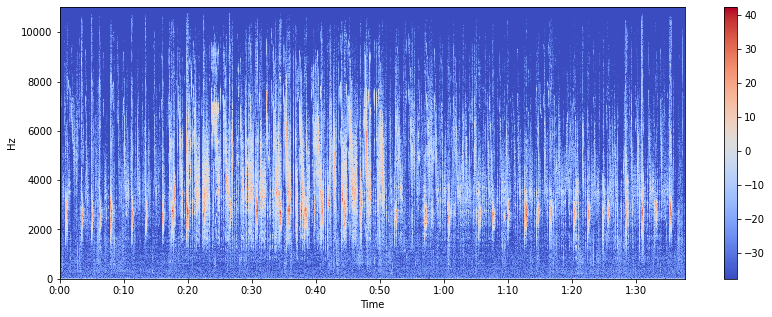

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_pingro), sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

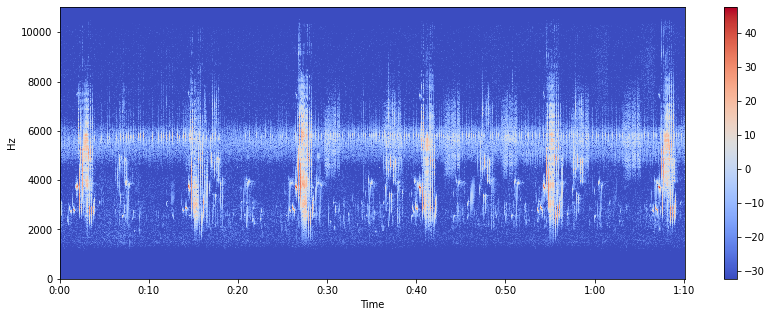

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.specshow(librosa.amplitude_to_db(D_vesspa), sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

### Feature extraction from audio signal


*   Every audio signal consists of many features. However, we must extract the characteristics that are relevant to the problem we are trying to solve. The process of extracting features to use them for analysis is called feature extraction.

The spectral features (frequency-based features), which are obtained by 
converting the time-based signal into the frequency domain using the Fourier Transform, like fundamental frequency, frequency components, spectral centroid, spectral flux, spectral density, spectral roll-off, etc.







**1] Spectral Centroid**

-> indicates at which frequency the energy of a spectrum is centered upon or  It indicates where the ” center of mass” for a sound is located.

In [ ]:
import sklearn

x, sr = librosa.load(audio_data_amered)

"""
.spectral_centroid() will return an array with columns
 equal to the number of frames present in your sample."""
 
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0] 
spectral_centroids.shape


(222,)

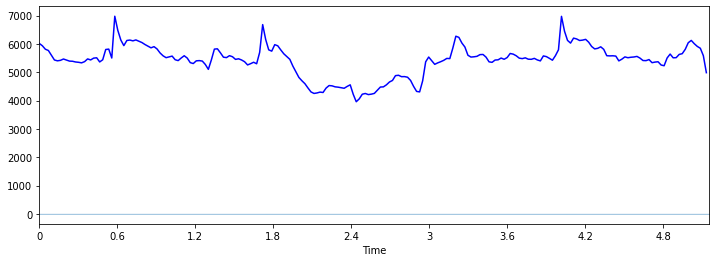

In [ ]:

# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Plotting the Spectral Centroid along the waveform without normalising
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, spectral_centroids, color='b')

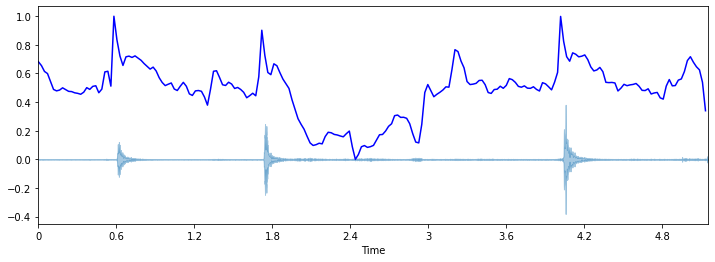

In [ ]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform without normalising
plt.figure(figsize=(12, 4))
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='b')

2.] Spectral Roloff

Is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy (e.g. 85%) lies.

librosa.feature.spectral_rolloff computes the roll off frequency for each frame in a signal

In [ ]:
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)[0]
spectral_rolloff[0:100]

array([8484.08203125, 8473.31542969, 8441.015625  , 8484.08203125,
       8451.78222656, 8354.8828125 , 8311.81640625, 8333.34960938,
       8494.84863281, 8484.08203125, 8484.08203125, 8602.51464844,
       8559.44824219, 8419.48242188, 8484.08203125, 8559.44824219,
       8537.91503906, 8494.84863281, 8667.11425781, 8580.98144531,
       8354.8828125 , 8322.58300781, 7988.81835938, 8085.71777344,
       8247.21679688, 7838.0859375 , 7439.72167969, 7299.75585938,
       7202.85644531, 7299.75585938, 7342.82226562, 7396.65527344,
       7515.08789062, 7515.08789062, 7536.62109375, 7708.88671875,
       7870.38574219, 7924.21875   , 8204.15039062, 8204.15039062,
       8236.45019531, 8236.45019531, 8301.04980469, 8376.41601562,
       8484.08203125, 8430.24902344, 8537.91503906, 8764.01367188,
       8785.546875  , 8699.4140625 , 8494.84863281, 8408.71582031,
       8613.28125   , 8602.51464844, 8548.68164062, 8462.54882812,
       8290.28320312, 7967.28515625, 7611.98730469, 7515.08789

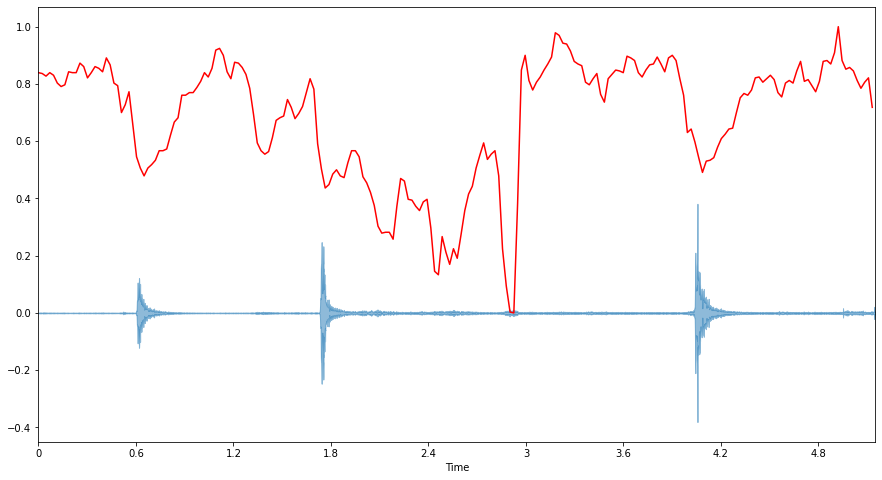

In [ ]:
# visualization
plt.figure(figsize=(15, 8))
librosa.display.waveplot(x, sr=sr, alpha=0.5)   # alpha denotes range of y-axis
plt.plot(t, normalize(spectral_rolloff), color='r')

### 3] Zero Crossing Rate

Tells rate at which the signal changes from positive to negative or back

-> A voice signal oscillates slowly — for example, a 100 Hz signal will cross zero 100 per second — whereas an unvoiced fricative can have 3000 zero crossings per second.

Observation-> It usually has higher values for highly percussive sounds like those in metal and rock. 

In [ ]:
zero_amered = librosa.zero_crossings(audio_amered, pad=False)
zero_amered

array([False, False, False, ..., False,  True,  True])

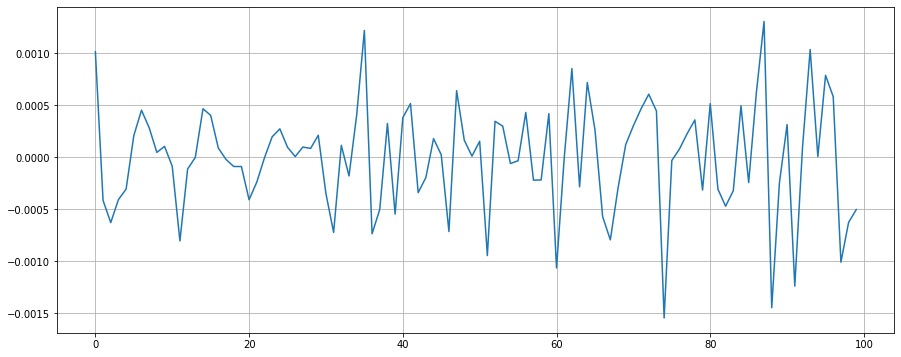

In [ ]:
# Visualization
## Zooming in 

n0 = 1000
n1= 1100
plt.figure(figsize=(15,6))
plt.plot(x[n0:n1])
plt.grid()

In [ ]:
# No. of zero crossings in selected frame
sum(librosa.zero_crossings(x[n0:n1], pad=False))

43

### 4] Mel-Frequency Capstral Coefficients [ MFCCs]

Definition: MFCCs are a compact representation of the spectrum(When a waveform is represented by a summation of possibly infinite number of sinusoids) of an audio signal.

->The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) that concisely describe the overall shape of a spectral envelope. 

-> It models the characteristics of the human voice [ Mel scale].


In [ ]:
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

(20, 222)


In [ ]:
# displaying mfcc feature vector
mfccs

array([[-6.52583130e+02, -6.56061462e+02, -6.60379456e+02, ...,
        -5.90182739e+02, -5.90498901e+02, -5.16421631e+02],
       [-1.21544876e+02, -1.25127205e+02, -1.23826019e+02, ...,
        -1.65394379e+02, -1.63727036e+02, -1.24324089e+02],
       [-3.22586937e+01, -3.24332809e+01, -3.21728821e+01, ...,
        -5.52785950e+01, -5.85616837e+01, -4.61818008e+01],
       ...,
       [ 5.37368870e+00,  1.02854836e+00, -7.28285313e-01, ...,
        -3.94624209e+00, -5.47363472e+00, -7.58796740e+00],
       [ 8.83727729e-01,  7.66550601e-01, -1.30757242e-01, ...,
         1.53240681e+00,  6.84429646e-01,  5.02591372e+00],
       [-6.28223777e-01,  8.10293972e-01,  2.81036210e+00, ...,
         7.44238794e-01,  5.86006165e+00,  7.82928085e+00]], dtype=float32)

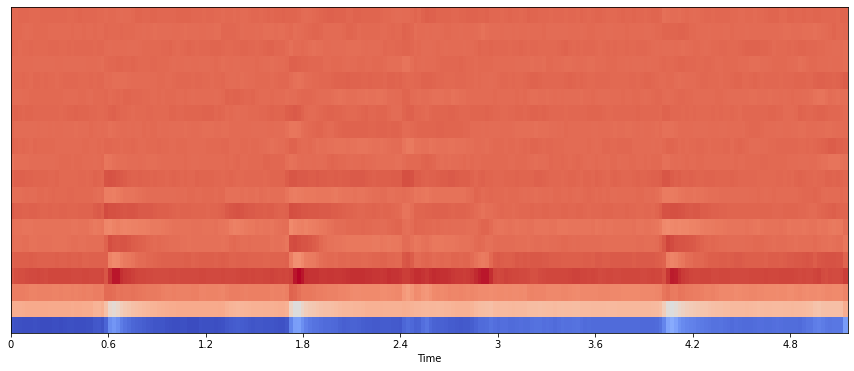

In [ ]:
# Visualization

plt.figure(figsize=(15,6))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
# y-axis denotes MFCC coefficients

## 5] Chroma feature

A chroma feature or vector is typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, …, B}, is present in the signal. In short, It provides a robust way to describe a similarity measure between music pieces.

Library used: librosa.feature.chroma_stft

In [ ]:
chromagram = librosa.feature.chroma_stft(x, sr=sr)
# displaying obtained feature vectors
chromagram

array([[0.6908893 , 0.7271548 , 0.6871306 , ..., 0.8221476 , 0.83770573,
        0.3072064 ],
       [0.42799532, 0.4496585 , 0.41844955, ..., 0.41988906, 1.        ,
        0.4216399 ],
       [0.3914483 , 0.40639964, 0.54852176, ..., 0.32562232, 0.90421003,
        0.5948242 ],
       ...,
       [0.52894616, 0.6640674 , 0.72210926, ..., 0.29610446, 0.41871792,
        1.        ],
       [0.7182472 , 0.74248415, 0.8103219 , ..., 0.5251743 , 0.4867637 ,
        0.3881345 ],
       [1.        , 0.9785765 , 0.7430797 , ..., 1.        , 0.7807787 ,
        0.29977202]], dtype=float32)

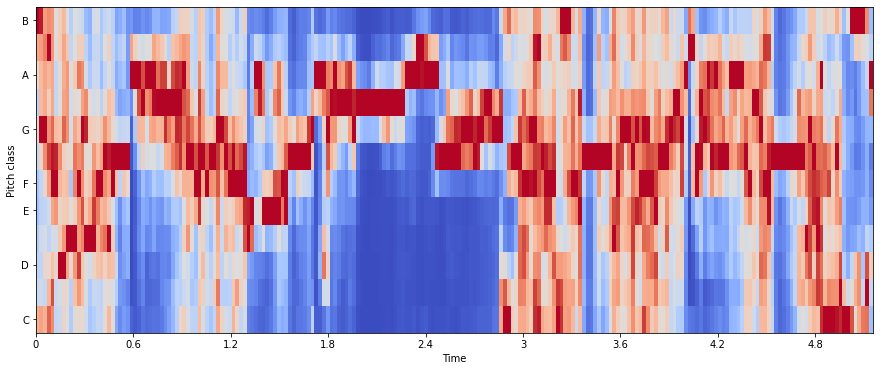

In [ ]:
# visualization
plt.figure(figsize=(15, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')